<a href="https://colab.research.google.com/github/fridriscvski/weeds-segmentation/blob/main/segmentation_results.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Segmentation results

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

# Distribuição de classes nos datasets

### Corn weeds

In [ ]:
DATASET_PATH = '/content/drive/MyDrive/TCC/cropped_corn_weeds'
sets = ['train']
annots = {s: [] for s in sets}
flattened_annot = {s: [] for s in sets}

for s in sets:
    annots_folder = os.path.join(DATASET_PATH, s, 'annotations')
    annots_files = os.listdir(annots_folder)  # Limit the number of files to process
    annot_paths = [os.path.join(annots_folder, f) for f in annots_files]

    annots[s] = [cv2.imread(path, cv2.IMREAD_GRAYSCALE).flatten() for path in annot_paths if os.path.isfile(path)]

    if annots[s]:
        flattened_annot[s] = np.concatenate(annots[s])

In [ ]:
for s in sets:
    np.save(os.path.join('/content/drive/MyDrive/TCC/auxs', f'{s}_flattened_ds.npy'), flattened_annot[s])

In [ ]:
sets = ['train', 'test', 'validation']
annots = {s: [] for s in sets}
flattened_annot = {s: [] for s in sets}

flattened_annot['train'] = np.load('/content/drive/MyDrive/TCC/auxs/train_flattened_ds.npy')
flattened_annot['test'] = np.load('/content/drive/MyDrive/TCC/auxs/test_flattened_ds.npy')
flattened_annot['validation'] = np.load('/content/drive/MyDrive/TCC/auxs/validation_flattened_ds.npy')

set_values = {
    'train': [],
    'test': [],
    'validation': []
}

for i, s in enumerate(sets):
    unique_values, counts = np.unique(flattened_annot[s], return_counts=True)

    values = np.zeros(16)
    for j, unique_value in enumerate(unique_values):
        values[unique_value] = counts[j]

    set_values[s] = values

plt.show()

<ipython-input-5-5960918190ac>:52: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(classes[2:], rotation=60, ha='right')


90.54533544197514
4.335516562852055


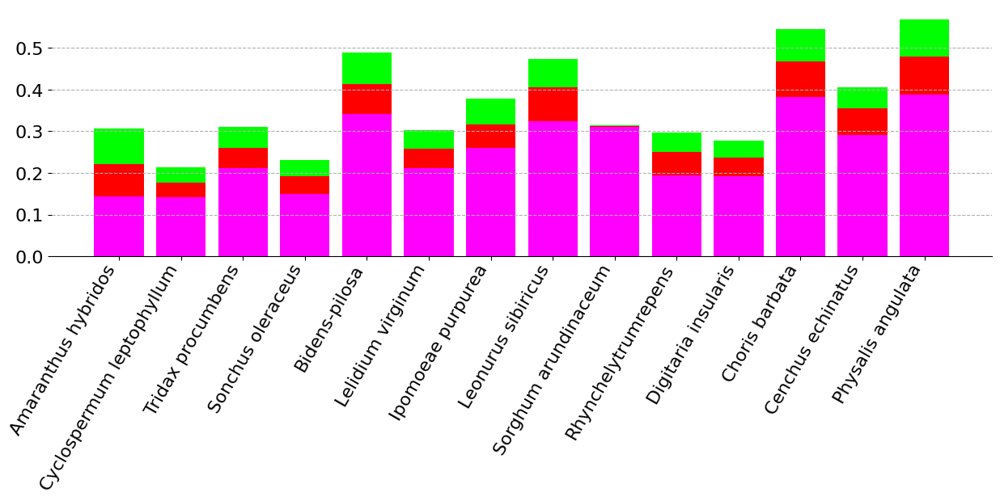

In [ ]:
plt.rcParams.update({'font.size': 16})

colors = [
    (0,0,0),                        # background
    (155/255, 210/255, 10/255),     # corns
    (255/255, 111/255, 97/255),     # Amaranthus hybridos
    (255/255, 215/255, 0/255),      # Cyclospermum leptophyllum
    (64/255, 224/255, 208/255),     # Tridax procumbens
    (147/255, 112/255, 219/255),    # Sonchus oleraceus
    (0/255, 255/255, 0/255),        # Bidens-pilosa
    (255/255, 69/255, 0/255),       # Lelidium virginum
    (135/255, 206/255, 235/255),    # Ipomoeae purpurea
    (138/255, 43/255, 226/255),     # Leonurus sibiricus
    (255/255, 20/255, 147/255),     # Sorghum arundinaceum
    (50/255, 205/255, 50/255),      # Rhynchelytrumrepens
    (186/255, 85/255, 211/255),     # Digitaria insularis
    (255/255, 99/255, 71/255),      # Choris barbata
    (0/255, 206/255, 209/255),      # Cenchus echinatus
    (139/255, 69/255, 19/255)       # Physalis angulata
]

_, ax = plt.subplots(1, 1, figsize=(15, 4), sharex=True)
classes = ['background', 'corns', 'Amaranthus hybridos', 'Cyclospermum leptophyllum',
           'Tridax procumbens', 'Sonchus oleraceus', 'Bidens-pilosa', 'Lelidium virginum',
           'Ipomoeae purpurea', 'Leonurus sibiricus', 'Sorghum arundinaceum', 'Rhynchelytrumrepens',
           'Digitaria insularis', 'Choris barbata', 'Cenchus echinatus', 'Physalis angulata']

total = 0
background_percentage = 0
corns_percentage = 0

for s in sets:
    total += sum(set_values[s])

for i, s in enumerate(sets):
    percentage = set_values[s] / total * 100

    background_percentage += percentage[0]
    corns_percentage += percentage[1]

    if i == 1:
        bottom_percentage = set_values[sets[i-1]] / total * 100
        ax.bar(classes[2:], percentage[2:], color="#FF0000", bottom=bottom_percentage[2:])
    elif i == 2:
        bottom_percentage = set_values[sets[i-1]] / total * 100
        bottom_percentage += set_values[sets[i-2]] / total * 100
        ax.bar(classes[2:], percentage[2:], color="#00FF00", bottom=bottom_percentage[2:])
    else:
        ax.bar(classes[2:], percentage[2:], color="#FF00FF")


    ax.set_xticklabels(classes[2:], rotation=60, ha='right')
    ax.tick_params(axis='x', which='major', pad=1)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.grid(axis='y', linestyle='--')

print(background_percentage)
print(corns_percentage)


90.54533544197514
4.335516562852055


<ipython-input-6-0fd879b606b1>:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(sorted_classes[2:], rotation=60, ha='right')


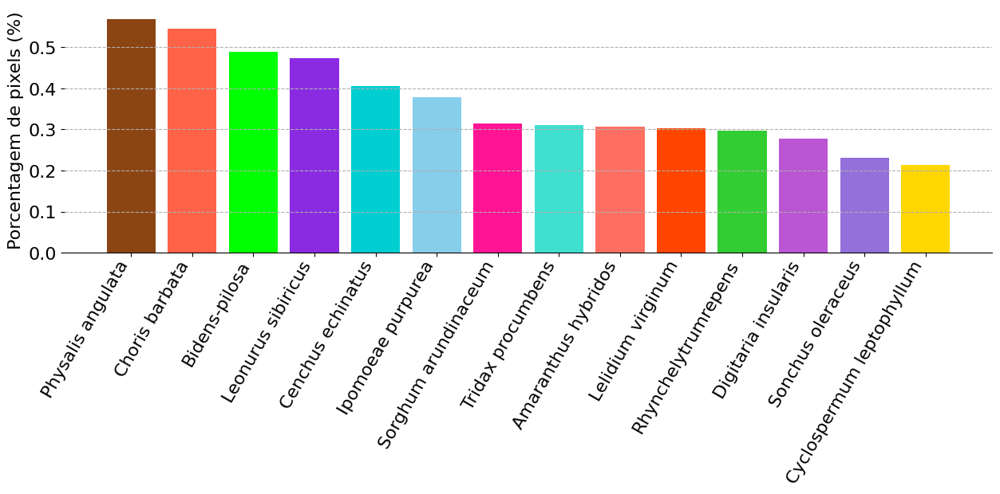

In [ ]:
total = 0
total_values = [sum(values) for values in zip(set_values['train'], set_values['test'], set_values['validation'])]

# Organiza os dados em ordem decrescente
sorted_indices = sorted(range(len(total_values)), key=lambda k: total_values[k], reverse=True)
sorted_classes = [classes[i] for i in sorted_indices]
sorted_total_values = [total_values[i] for i in sorted_indices]
sorted_colors = [colors[i] for i in sorted_indices]

_, ax = plt.subplots(1, 1, figsize=(15, 4), sharex=True)

# Calcula o total de valores corretamente
total = sum(total_values)

background_percentage = 0
corns_percentage = 0

for i, s in enumerate(set_values):
    percentage = [set_values[s][i] / total * 100 for i in range(len(classes))]
    background_percentage += percentage[0]
    corns_percentage += percentage[1]

ax.bar(sorted_classes[2:], [v / total * 100 for v in sorted_total_values][2:], color=sorted_colors[2:])
ax.set_xticklabels(sorted_classes[2:], rotation=60, ha='right')
ax.tick_params(axis='x', which='major', pad=1)

ax.set_ylabel('Porcentagem de pixels (%)')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.grid(axis='y', linestyle='--')

print(background_percentage)
print(corns_percentage)

plt.show()


### Blender

In [ ]:
DATASET_PATH = '/content/drive/MyDrive/TCC/cropped_blender_digital_twin'

annots_folder = os.path.join(DATASET_PATH, 'annotations')
annots_files = os.listdir(annots_folder)  # Limit the number of files to process
annot_paths = [os.path.join(annots_folder, f) for f in annots_files]
annots = [cv2.imread(path, cv2.IMREAD_GRAYSCALE).flatten() for path in annot_paths if os.path.isfile(path)]

In [ ]:
np.save(os.path.join('/content/drive/MyDrive/TCC/auxs', f'blender_flattened_ds.npy'), annots)

89.0439215766059
5.8336505466037325


<ipython-input-8-2132d96abc44>:65: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(sorted_classes, rotation=60, ha='right')


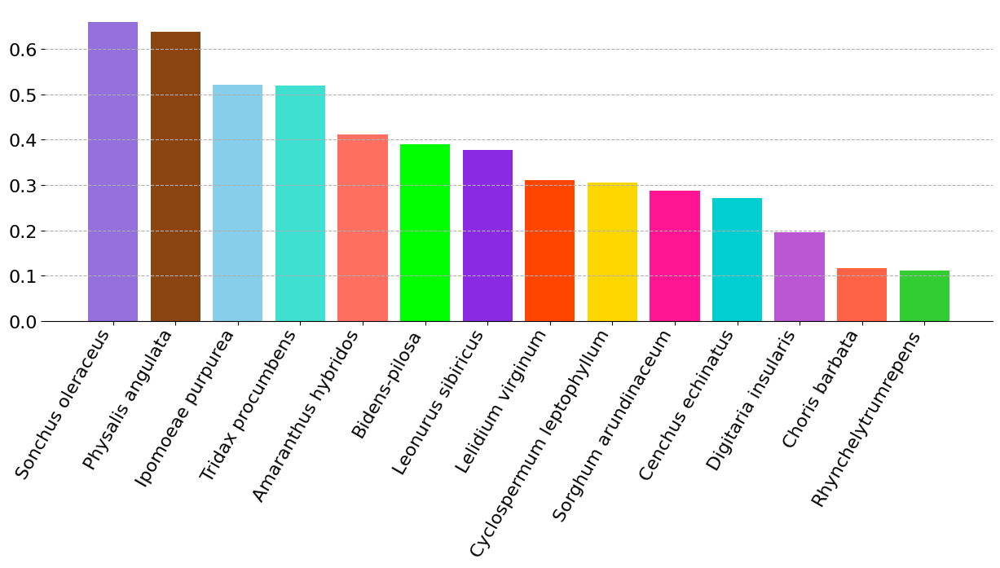

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

annots = np.load('/content/drive/MyDrive/TCC/auxs/blender_flattened_ds.npy')



# Load the annotation data
# annots = np.load('/content/drive/MyDrive/TCC/auxs/blender_train_flattened_ds.npy')

# Define the colors
colors = [
    (0, 0, 0),                        # background
    (155/255, 210/255, 10/255),       # corns
    (255/255, 111/255, 97/255),       # Amaranthus hybridos
    (255/255, 215/255, 0/255),        # Cyclospermum leptophyllum
    (64/255, 224/255, 208/255),       # Tridax procumbens
    (147/255, 112/255, 219/255),      # Sonchus oleraceus
    (0/255, 255/255, 0/255),          # Bidens-pilosa
    (255/255, 69/255, 0/255),         # Lelidium virginum
    (135/255, 206/255, 235/255),      # Ipomoeae purpurea
    (138/255, 43/255, 226/255),       # Leonurus sibiricus
    (255/255, 20/255, 147/255),       # Sorghum arundinaceum
    (50/255, 205/255, 50/255),        # Rhynchelytrumrepens
    (186/255, 85/255, 211/255),       # Digitaria insularis
    (255/255, 99/255, 71/255),        # Choris barbata
    (0/255, 206/255, 209/255),        # Cenchus echinatus
    (139/255, 69/255, 19/255)         # Physalis angulata
]

# Get the unique values and their counts
unique_values, counts = np.unique(annots, return_counts=True)

# Initialize the values array
values = np.zeros(16)
for j, unique_value in enumerate(unique_values):
    values[unique_value] = counts[j]

# Create the classes list
classes = [
    'background', 'corns', 'Amaranthus hybridos', 'Cyclospermum leptophyllum',
    'Tridax procumbens', 'Sonchus oleraceus', 'Bidens-pilosa', 'Lelidium virginum',
    'Ipomoeae purpurea', 'Leonurus sibiricus', 'Sorghum arundinaceum', 'Rhynchelytrumrepens',
    'Digitaria insularis', 'Choris barbata', 'Cenchus echinatus', 'Physalis angulata'
]

# Calculate total and percentages
total = sum(values)
percentage = values / total * 100
background_percentage = percentage[0]
corns_percentage = percentage[1]

# Combine values, colors, and classes
combined = list(zip(percentage, colors, classes))

# Sort the combined list by percentage in descending order (excluding background and corns)
sorted_combined = sorted(combined[2:], key=lambda x: x[0], reverse=True)

# Unzip the sorted list
sorted_percentage, sorted_colors, sorted_classes = zip(*sorted_combined)

# Plotting
_, ax = plt.subplots(1, 1, figsize=(15, 5), sharex=True)
ax.bar(sorted_classes, sorted_percentage, color=sorted_colors)
ax.set_xticklabels(sorted_classes, rotation=60, ha='right')
ax.tick_params(axis='x', which='major', pad=1)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.grid(axis='y', linestyle='--')

print(background_percentage)
print(corns_percentage)
plt.show()


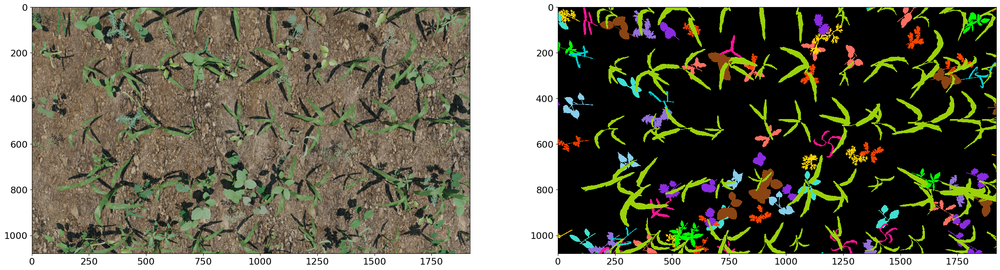

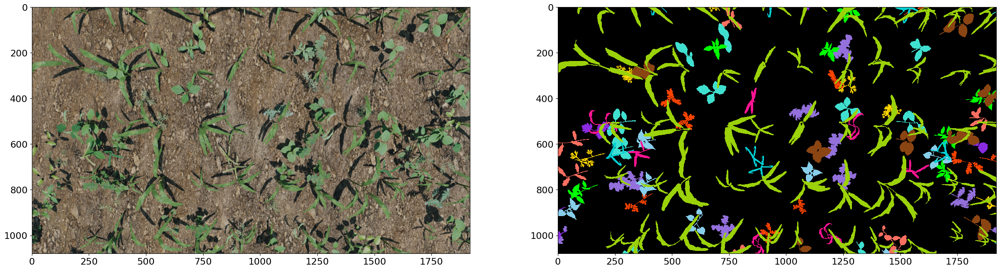

In [ ]:
from matplotlib.colors import LinearSegmentedColormap

ds_path = 'drive/My Drive/TCC/blender_digital_twin_dataset'
images_path = os.listdir(os.path.join(ds_path, 'images'))
masks_path = os.listdir(os.path.join(ds_path, 'annotations'))

positions = np.linspace(0, 1, len(colors))
cmap = LinearSegmentedColormap.from_list('CustomCmap', list(zip(positions, colors)))

images_path.sort()
masks_path.sort()

for i in range(2):
    _, axes = plt.subplots(1,2, figsize=(30, 20))
    image = cv2.imread(os.path.join(ds_path, "images", images_path[i]))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(os.path.join(ds_path, "annotations", masks_path[i]), cv2.IMREAD_GRAYSCALE)

    axes[0].imshow(image)
    axes[1].imshow(mask, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')

### Misto

<class 'set'> background percentage: 90.54024509282374
<class 'set'> corns percentage: 4.369419994603089
<class 'set'> background percentage: 90.5661417801927
<class 'set'> corns percentage: 4.233507383508231
<class 'set'> background percentage: 90.54771630638257
<class 'set'> corns percentage: 4.282195020623834


<ipython-input-10-7f937dbe2fda>:33: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(classes[2:], rotation=60, ha='right')


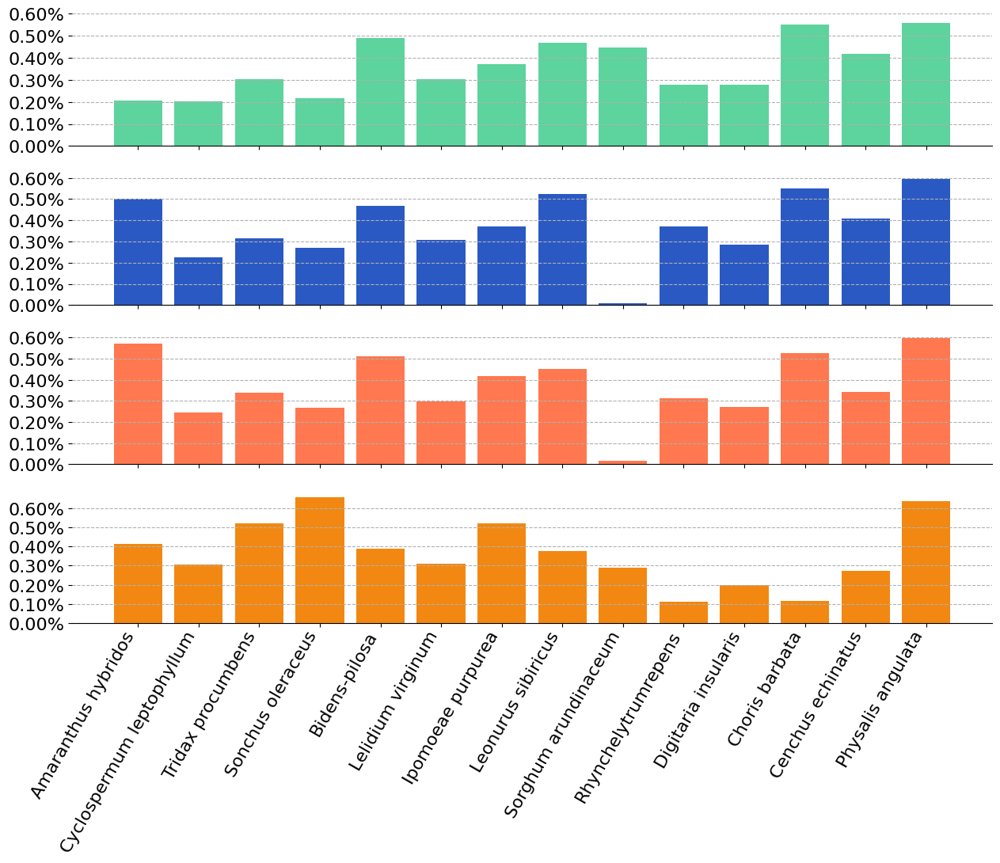

In [ ]:
import matplotlib.ticker as ticker

colors = ['#5DD39E', '#2B59C3', '#FF784F', '#F28811']

_, axes = plt.subplots(4, 1, figsize=(15, 10), sharex=True)

for i, s in enumerate(sets):
    total = sum(set_values[s])
    percentage = set_values[s] / total * 100

    print(f'{set} background percentage: {percentage[0]}')
    print(f'{set} corns percentage: {percentage[1]}')

    axes[i].bar(classes[2:], percentage[2:], color=colors[i])


percentage = values / sum(values) * 100
axes[-1].bar(classes[2:], percentage[2:], color=colors[-1])

for ax in axes:

    ax.yaxis.set_ticks(np.arange(0, 0.7, 0.1))

    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x:.2f}%'))


    ax.tick_params(axis='x', which='major', pad=1)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.grid(axis='y', linestyle='--')
    ax.tick_params(axis='x', which='major', pad=1)
    ax.set_xticklabels(classes[2:], rotation=60, ha='right')


# Models results

In [ ]:
!pip install -U segmentation-models-pytorch
!pip install pretrainedmodels>=0.7.4
!pip install torchmetrics
!pip install albumentations==0.4.6

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 83.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_

In [ ]:
import os
import cv2
import torch
import torchmetrics
import segmentation_models_pytorch as smp
import numpy as np
import matplotlib.pyplot as plt
import albumentations as albu
from albumentations.pytorch import ToTensorV2
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

## Visualization

In [ ]:
class CornWeedsDataset(Dataset):
    CLASSES = [
        "background", "corns", "amaranthus hybridos", "cyclospermum leptophyllum", "tridax procumbens",
        "sonchus oleraceus", "bidens-pilosa", "lelidium virginum", "ipomoeae purpurea",
        "leonurus sibiricus", "sorghum arundinaceum", "rhynchelytrumrepens", "digitaria insularis",
        "choris barbata", "cenchus echinatus", "physalis angulata"
    ]

    def __init__(
        self,
        images_dir,
        annotations_dir,
        classes=None,
        preprocessing=None,
        transform=None
  ):
        self.ids = os.listdir(images_dir)
        self.images = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.annotations = [os.path.join(annotations_dir, image_id) for image_id in self.ids]
        self.preprocessing = preprocessing
        self.transform = transform

        if classes:
            self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]
        else:
            self.class_values = np.arange(0, len(CornWeedsDataset.CLASSES))

    def __getitem__(self, i):
        image = cv2.imread(self.images[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.annotations[i], cv2.IMREAD_GRAYSCALE)

        # mask = np.zeros((simple_mask.shape[0], simple_mask.shape[1], len(self.class_values)))
        # for class_value in self.class_values:
        #     mask[:, :, class_value] = (simple_mask == class_value).astype(float)

        if self.transform is not None:
            sample = self.transform(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask

    def __len__(self):
        return len(self.images)

In [ ]:
DATASET_PATH = 'drive/My Drive/TCC/cropped_corn_weeds'
TEST_DATASET_PATH = os.path.join(DATASET_PATH, 'test')

test_transform = albu.Compose([
    albu.PadIfNeeded(min_height=256, min_width=256, border_mode=4),
    albu.Resize(256, 256),
    ToTensorV2(),
])

test_dataset = CornWeedsDataset(
    os.path.join(TEST_DATASET_PATH, 'images'),
    os.path.join(TEST_DATASET_PATH, 'annotations'),
    classes=None,
    transform=test_transform
)

n_workers = os.cpu_count()
batch_size = 8

test_data_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,
                                               shuffle=False, num_workers=n_workers)


- Focal loss
- Modelo treinado apenas com as imagens do cornweeds

In [ ]:
DEVICE = 'cuda'
ACTIVATION = None
MODE: str = 'multiclass'
LEARNING_RATE = 1e-4
ENCODER = 'resnet152'
ENCODER_WEIGHTS = 'imagenet'
classes = 16

model_name = 'unet_ce_mixed_model'
model_path = f'drive/My Drive/TCC/trained models/{model_name}.pth'
output_path = f'drive/My Drive/TCC/predictions/{model_name}'

os.makedirs(output_path, exist_ok=True)

model = smp.Unet(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    in_channels = 3,
    classes=16,
    activation=ACTIVATION
)

model.load_state_dict(torch.load(model_path))
model.eval()
model.to(DEVICE)

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

In [ ]:
import torch.nn as nn

all_images = os.listdir('drive/My Drive/TCC/predictions/unet_ce_mixed_model')

with torch.no_grad():
    for i in range(len(test_dataset)):
        image_name = test_dataset.ids[i]
        if image_name not in all_images:
          image, _ = test_dataset[i]
          x_tensor = image.to(DEVICE).unsqueeze(0).float()

          pr_mask = model.predict(x_tensor)
          m = nn.Softmax(dim=1)
          pr_probs = m(pr_mask)
          pr_mask = torch.argmax(pr_probs, dim=1).squeeze(1)
          pr_mask = pr_mask.squeeze().cpu().detach().numpy()

          cv2.imwrite(os.path.join(output_path, f'{image_name}'), pr_mask)

In [ ]:
  # os.listdir('drive/My Drive/TCC/')
  print(len(os.listdir('drive/My Drive/TCC/predictions/unet_ce_cropped_model')))
  print(len(os.listdir('drive/My Drive/TCC/predictions/unet_fl_cropped_model')))
  print(len(os.listdir('drive/My Drive/TCC/predictions/unet_ce_blender_model')))
  print(len(os.listdir('drive/My Drive/TCC/predictions/unet_fl_blender_model')))
  print(len(os.listdir('drive/My Drive/TCC/predictions/unet_ce_mixed_model')))
  print(len(os.listdir('drive/My Drive/TCC/predictions/unet_fl_mixed_model')))

3846
3846
3846
3846
3846
3846


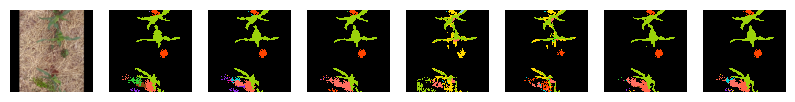

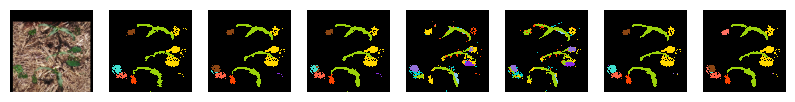

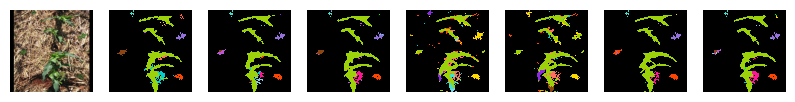

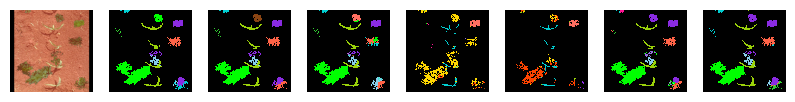

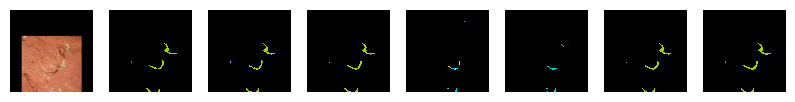

...

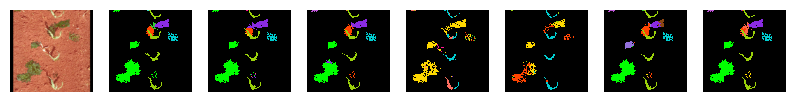

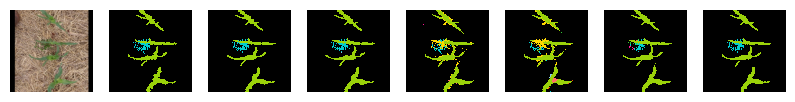

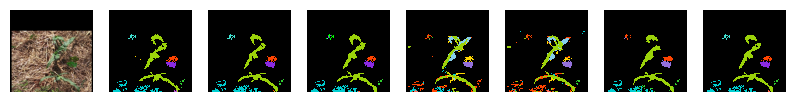

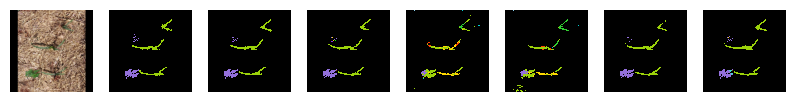

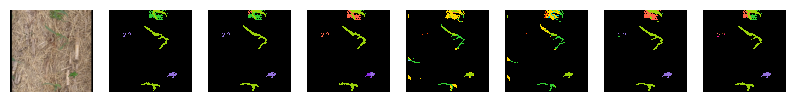

In [ ]:
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import random
import os

colors = [
    (0,0,0),                        # background
    (155/255, 210/255, 10/255),     # corns
    (255/255, 111/255, 97/255),     # Amaranthus hybridos
    (255/255, 215/255, 0/255),      # Cyclospermum leptophyllum
    (64/255, 224/255, 208/255),     # Tridax procumbens
    (147/255, 112/255, 219/255),    # Sonchus oleraceus
    (0/255, 255/255, 0/255),        # Bidens-pilosa
    (255/255, 69/255, 0/255),       # Lelidium virginum
    (135/255, 206/255, 235/255),    # Ipomoeae purpurea
    (138/255, 43/255, 226/255),     # Leonurus sibiricus
    (255/255, 20/255, 147/255),     # Sorghum arundinaceum
    (50/255, 205/255, 50/255),      # Rhynchelytrumrepens
    (186/255, 85/255, 211/255),     # Digitaria insularis
    (255/255, 99/255, 71/255),      # Choris barbata
    (0/255, 206/255, 209/255),      # Cenchus echinatus
    (139/255, 69/255, 19/255)       # Physalis angulata
]

positions = np.linspace(0, 1, len(colors))
cmap = LinearSegmentedColormap.from_list('CustomCmap', list(zip(positions, colors)))

for i in range(12):
    random_index = random.randint(0, len(test_dataset))
    image_name = test_dataset.ids[random_index]
    image = cv2.imread(f'drive/My Drive/TCC/cropped_corn_weeds/test/images/{image_name}')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(f'drive/My Drive/TCC/cropped_corn_weeds/test/annotations/{image_name}', cv2.IMREAD_GRAYSCALE)
    # pr_mask1 = cv2.imread(f'drive/My Drive/TCC/predictions/ce_cropped_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    # pr_mask2 = cv2.imread(f'drive/My Drive/TCC/predictions/fl_cropped_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    # pr_mask3 = cv2.imread(f'drive/My Drive/TCC/predictions/ce_blender_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    # pr_mask4 = cv2.imread(f'drive/My Drive/TCC/predictions/fl_blender_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    # pr_mask5 = cv2.imread(f'drive/My Drive/TCC/predictions/ce_mixed_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    # pr_mask6 = cv2.imread(f'drive/My Drive/TCC/predictions/fl_mixed_model/{image_name}', cv2.IMREAD_GRAYSCALE)

    pr_mask7 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_ce_cropped_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    pr_mask8 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_fl_cropped_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    pr_mask9 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_ce_blender_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    pr_mask10 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_fl_blender_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    pr_mask11 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_ce_mixed_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    pr_mask12 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_fl_mixed_model/{image_name}', cv2.IMREAD_GRAYSCALE)

    fig, axes = plt.subplots(1, 8, figsize=(10, 5))
    axes[0].imshow(image)
    axes[1].imshow(gt_mask, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    # axes[2].imshow(pr_mask1, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    # axes[3].imshow(pr_mask2, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    # axes[4].imshow(pr_mask3, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    # axes[5].imshow(pr_mask4, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    # axes[6].imshow(pr_mask5, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    # axes[7].imshow(pr_mask6, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[2].imshow(pr_mask7, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[3].imshow(pr_mask8, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[4].imshow(pr_mask9, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[5].imshow(pr_mask10, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[6].imshow(pr_mask11, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[7].imshow(pr_mask12, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')

    for ax in axes:
        ax.axis('off')

    plt.show()

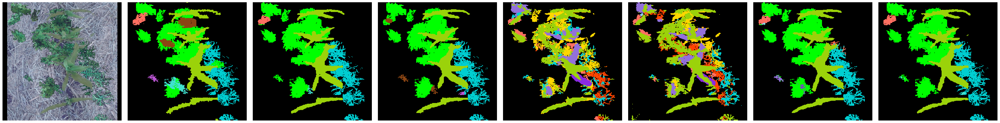

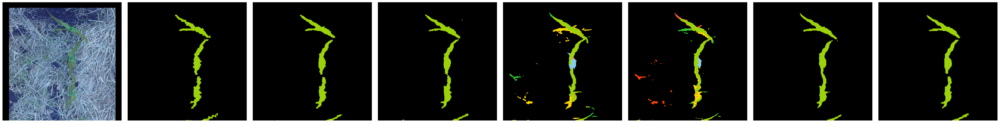

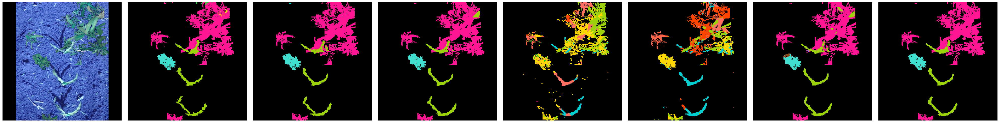

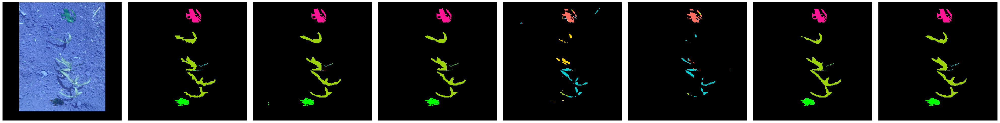

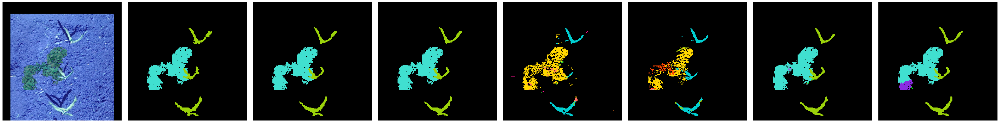

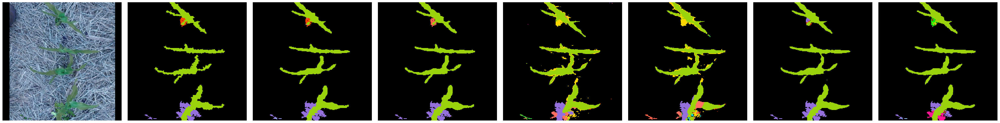

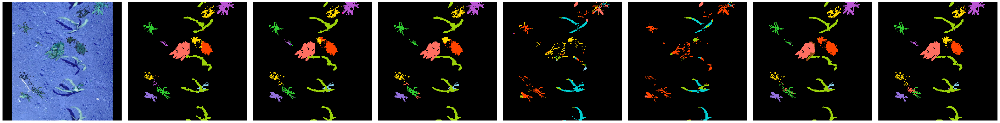

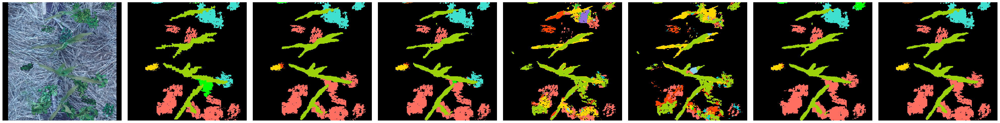

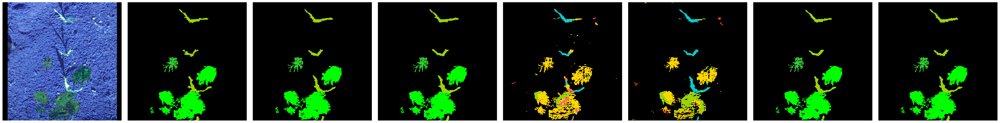

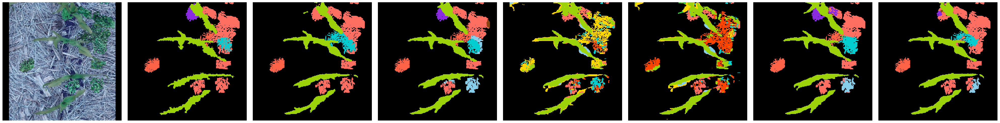

In [ ]:
output_dir = 'drive/My Drive/TCC/output_samples'
os.makedirs(output_dir, exist_ok=True)

for i in range(10):
    random_index = random.randint(0, len(test_dataset))
    image_name = test_dataset.ids[random_index]
    image = cv2.imread(f'drive/My Drive/TCC/cropped_corn_weeds/test/images/{image_name}')
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(f'drive/My Drive/TCC/cropped_corn_weeds/test/annotations/{image_name}', cv2.IMREAD_GRAYSCALE)
    pr_mask7 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_ce_cropped_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    pr_mask8 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_fl_cropped_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    pr_mask9 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_ce_blender_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    pr_mask10 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_fl_blender_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    pr_mask11 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_ce_mixed_model/{image_name}', cv2.IMREAD_GRAYSCALE)
    pr_mask12 = cv2.imread(f'drive/My Drive/TCC/predictions/unet_fl_mixed_model/{image_name}', cv2.IMREAD_GRAYSCALE)

    fig, axes = plt.subplots(1, 8, figsize=(40, 15))
    axes[0].imshow(image)
    axes[1].imshow(gt_mask, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[2].imshow(pr_mask7, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[3].imshow(pr_mask8, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[4].imshow(pr_mask9, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[5].imshow(pr_mask10, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[6].imshow(pr_mask11, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')
    axes[7].imshow(pr_mask12, cmap=cmap, vmin=0, vmax=len(colors)-1, interpolation='nearest')

    for ax in axes:
        ax.axis('off')

    plt.tight_layout()

    cv2.imwrite(os.path.join(output_dir, f'{i}_image.png'), image)

    for j, ax in enumerate(axes[1:]):
        path_to_save = os.path.join(output_dir, f"{i}_{j}.png")
        extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig(path_to_save, bbox_inches=extent)



## mIoUs

In [ ]:
DATASET_PATH = '/content/drive/MyDrive/TCC/predictions'
sets = [
    'unet_ce_cropped_model',
    'unet_fl_cropped_model',
    'unet_ce_blender_model',
    'unet_fl_blender_model',
    'unet_ce_mixed_model',
    'unet_fl_mixed_model',
]

annots = {s: [] for s in sets}
flattened_annot = {s: [] for s in sets}

for s in sets:
    annots_folder = os.path.join(DATASET_PATH, s)
    annots_files = os.listdir(annots_folder)
    annots_files.sort()
    annot_paths = [os.path.join(annots_folder, f) for f in annots_files]

    annots[s] = [cv2.imread(path, cv2.IMREAD_GRAYSCALE).flatten() for path in annot_paths if os.path.isfile(path)]

    if annots[s]:
        flattened_annot[s] = np.concatenate(annots[s])

In [ ]:
for s in sets:
    np.save(os.path.join('/content/drive/MyDrive/TCC/auxs', f'{s}_flattened_ds.npy'), flattened_annot[s])

In [ ]:
flattened_gt_annot = np.array([])
GT_DATASET_PATH = '/content/drive/MyDrive/TCC/cropped_corn_weeds/test/annotations'
gt_files = os.listdir(GT_DATASET_PATH)
gt_files.sort()
gt_paths = [os.path.join(GT_DATASET_PATH, f) for f in gt_files]

gt_masks = [cv2.imread(path, cv2.IMREAD_GRAYSCALE).flatten() for path in gt_paths if os.path.isfile(path)]
flattened_gt_annot = np.concatenate(gt_masks)

np.save(os.path.join('/content/drive/MyDrive/TCC/auxs', f'gt_flattened_ds.npy'), flattened_gt_annot)

In [ ]:
sets = [
    'unet_ce_cropped_model',
    'unet_fl_cropped_model',
    'unet_ce_blender_model',
    'unet_fl_blender_model',
    'unet_ce_mixed_model',
    'unet_fl_mixed_model',
]

flattened_annot = {s: [] for s in sets}

for s in sets:
    flattened_annot[s] = np.load(os.path.join('/content/drive/MyDrive/TCC/auxs', f'{s}_flattened_ds.npy'))

flattened_gt_annot = np.load('/content/drive/MyDrive/TCC/auxs/gt_flattened_ds.npy')

In [ ]:
import torch
from torchmetrics.classification import MulticlassJaccardIndex

target = torch.from_numpy(flattened_gt_annot).to('cuda')

for s in sets:
    pred = torch.from_numpy(flattened_annot[s]).to('cuda')
    iou_fn = MulticlassJaccardIndex(num_classes=16, average=None).to('cuda')
    print(f'{s}: {iou_fn(pred, target)}')

unet_ce_cropped_model: tensor([0.9891, 0.8207, 0.7631, 0.7128, 0.7381, 0.7247, 0.7990, 0.7616, 0.7675,
        0.8120, 0.3458, 0.7707, 0.7745, 0.8280, 0.7656, 0.8403],
       device='cuda:0')
unet_fl_cropped_model: tensor([0.9895, 0.8258, 0.7202, 0.7013, 0.6796, 0.7155, 0.8010, 0.7579, 0.7104,
        0.8041, 0.2858, 0.7605, 0.7345, 0.8117, 0.7572, 0.8069],
       device='cuda:0')
unet_ce_blender_model: tensor([9.6686e-01, 3.8290e-01, 8.1756e-02, 2.0327e-02, 1.7356e-05, 4.0016e-02,
        1.5179e-04, 2.4069e-02, 3.9869e-03, 6.4598e-03, 0.0000e+00, 2.3863e-02,
        1.3807e-06, 8.6038e-04, 5.4291e-02, 3.9883e-05], device='cuda:0')
unet_fl_blender_model: tensor([9.6550e-01, 3.6094e-01, 6.1627e-02, 2.0783e-02, 4.0996e-05, 4.2264e-02,
        1.8345e-03, 2.8506e-02, 1.4607e-03, 7.0089e-03, 0.0000e+00, 4.6255e-02,
        1.6207e-05, 6.4968e-03, 5.2111e-02, 7.8163e-05], device='cuda:0')
unet_ce_mixed_model: tensor([0.9838, 0.7723, 0.6373, 0.6099, 0.5637, 0.5686, 0.7078, 0.6407, 0.6673,
 

In [ ]:
print(flattened_annot['unet_fl_mixed_model'].shape)
print(flattened_gt_annot.shape)

(252051456,)
(252051456,)


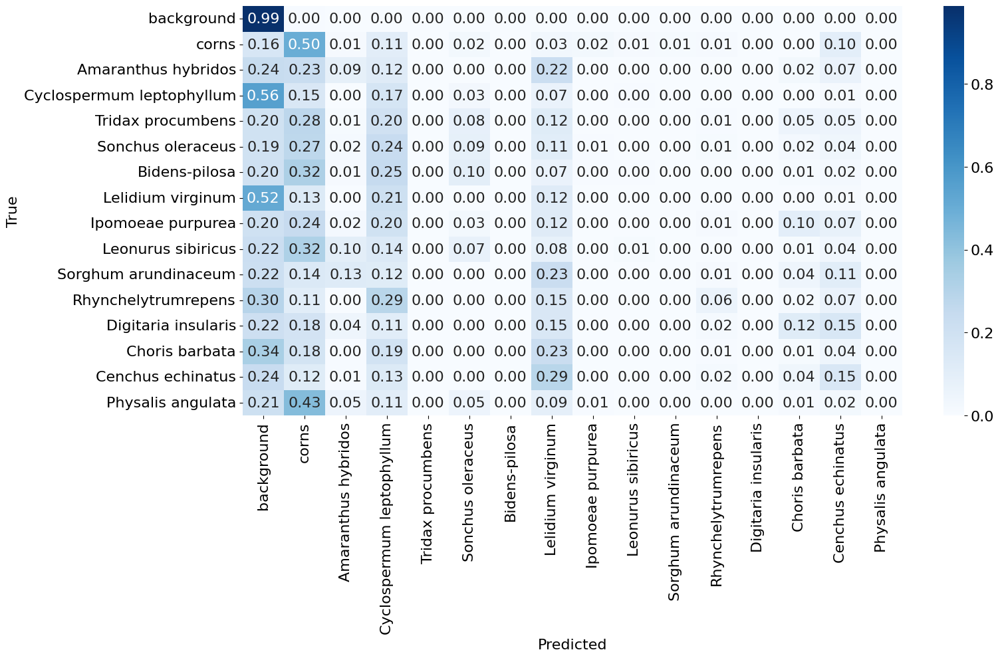

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

fig, ax = plt.subplots(1,1,figsize=(16, 8))
class_names = ['background', 'corns', 'Amaranthus hybridos', 'Cyclospermum leptophyllum', 'Tridax procumbens', 'Sonchus oleraceus', 'Bidens-pilosa', 'Lelidium virginum', 'Ipomoeae purpurea', 'Leonurus sibiricus', 'Sorghum arundinaceum', 'Rhynchelytrumrepens', 'Digitaria insularis', 'Choris barbata', 'Cenchus echinatus', 'Physalis angulata']

conf_matrix = confusion_matrix(flattened_gt_annot, flattened_annot['unet_fl_blender_model'], normalize='true')

sns.heatmap(conf_matrix, annot=True, cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=ax, fmt=".2f")
ax.set_xlabel('Predicted')
ax.set_ylabel('True')

plt.show()

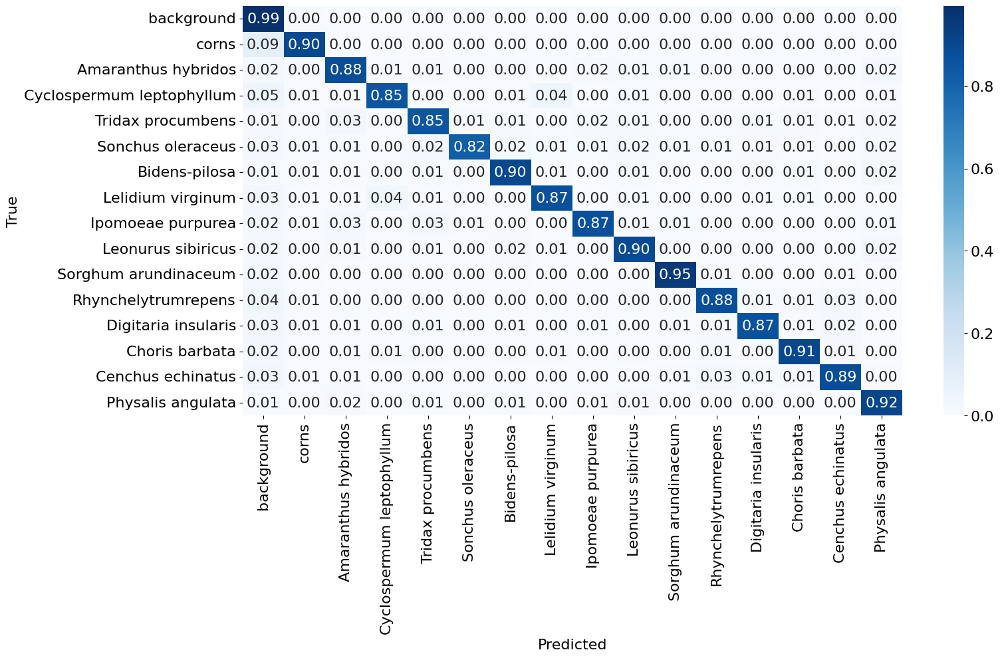

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

fig, ax = plt.subplots(1,1,figsize=(16, 8))
class_names = ['background', 'corns', 'Amaranthus hybridos', 'Cyclospermum leptophyllum', 'Tridax procumbens', 'Sonchus oleraceus', 'Bidens-pilosa', 'Lelidium virginum', 'Ipomoeae purpurea', 'Leonurus sibiricus', 'Sorghum arundinaceum', 'Rhynchelytrumrepens', 'Digitaria insularis', 'Choris barbata', 'Cenchus echinatus', 'Physalis angulata']

conf_matrix = confusion_matrix(flattened_gt_annot, flattened_annot['unet_fl_mixed_model'], normalize='true')

sns.heatmap(conf_matrix, annot=True, cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=ax, fmt=".2f")
ax.set_xlabel('Predicted')
ax.set_ylabel('True')

plt.show()

In [ ]:
import os
import cv2
import numpy as np
import torch
from torchmetrics.classification import MulticlassJaccardIndex

DATASET_PATH = '/content/drive/MyDrive/TCC/predictions'
GT_DATASET_PATH = '/content/drive/MyDrive/TCC/cropped_corn_weeds/test/annotations'
OUTPUT_PATH = '/content/drive/MyDrive/TCC/auxs'

os.makedirs(OUTPUT_PATH, exist_ok=True)

sets = [
    # 'ce_cropped_model',
    # 'fl_cropped_model',
    # 'ce_blender_model',
    # 'fl_blender_model',
    # 'ce_mixed_model',
    # 'fl_mixed_model',
    'unet_fl_cropped_model',
]

gt_files = os.listdir(GT_DATASET_PATH)
gt_files.sort()  # Sort the files
gt_masks = [cv2.imread(os.path.join(GT_DATASET_PATH, f), cv2.IMREAD_GRAYSCALE) for f in gt_files]
flattened_gt_annot = np.concatenate([mask.flatten() for mask in gt_masks])

np.save(os.path.join(OUTPUT_PATH, 'gt_flattened_ds.npy'), flattened_gt_annot)
target = torch.from_numpy(flattened_gt_annot).to('cuda')

for s in sets:
    annots_folder = os.path.join(DATASET_PATH, s)
    annots_files = os.listdir(annots_folder)
    annots_files.sort()
    annots = [cv2.imread(os.path.join(annots_folder, f), cv2.IMREAD_GRAYSCALE) for f in annots_files if os.path.isfile(os.path.join(annots_folder, f))]
    flattened_annot = np.concatenate([annot.flatten() for annot in annots])

    pred = torch.from_numpy(flattened_annot).to('cuda')

    iou_fn = MulticlassJaccardIndex(num_classes=16, average=None).to('cuda')
    iou_scores = iou_fn(pred, target)

    print(f'{s}: {iou_scores}')


ce_cropped_model: tensor([0.9755, 0.7954, 0.6507, 0.5704, 0.6179, 0.6222, 0.7398, 0.6823, 0.6251,
        0.7297, 0.2670, 0.5414, 0.5911, 0.6769, 0.5713, 0.7588],
       device='cuda:0')
fl_cropped_model: tensor([0.9679, 0.7201, 0.6214, 0.5253, 0.5412, 0.5829, 0.7056, 0.5994, 0.5729,
        0.6920, 0.4003, 0.4995, 0.5342, 0.5807, 0.5065, 0.6956],
       device='cuda:0')
ce_blender_model: tensor([9.5284e-01, 3.1248e-01, 5.3115e-02, 1.3831e-02, 2.7355e-04, 2.4128e-02,
        1.4498e-04, 1.3582e-02, 2.9036e-03, 6.4635e-03, 0.0000e+00, 8.5362e-03,
        0.0000e+00, 9.0316e-04, 5.8140e-02, 4.6351e-05], device='cuda:0')
fl_blender_model: tensor([9.5034e-01, 2.6299e-01, 9.7626e-02, 1.2430e-02, 7.5248e-04, 1.5645e-02,
        4.6602e-05, 1.1436e-03, 3.5935e-03, 5.9221e-03, 0.0000e+00, 4.2739e-05,
        0.0000e+00, 7.2187e-07, 3.0648e-02, 6.6085e-07], device='cuda:0')
ce_mixed_model: tensor([0.9766, 0.8027, 0.6939, 0.5904, 0.6484, 0.6542, 0.7638, 0.6931, 0.6379,
        0.7522, 0.3470, 0.